# Importando as bibliotecas 

In [230]:
# para manipulação de dados e estruturas tabulares
import pandas as pd 
# biblioteca para lidar com numeros
import numpy as np
# para vizualição grafica dos dados e resultados
import matplotlib.pyplot as plt 
# para vizualição grafica refinada dos dados e resultados.
import plotly.express as px 
# biblioteca para obter estatisticas descritivas mais acuradas
import statsmodels.api as sm 
# contagem de frequencia de itens
from collections import Counter
# para tratar strings
import re
# para alterar a estrutura das variaveis e normalizar
from sklearn.compose import make_column_transformer
from sklearn.preprocessing import OneHotEncoder, StandardScaler
# usado para fazer a separacao de treino e teste
from sklearn.model_selection import train_test_split
# para normalizar os dados
from sklearn.preprocessing import MinMaxScaler
# para definir metricas
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
# modelo de regressao linear
from sklearn import linear_model
# modelo de random forest regressor
from sklearn.ensemble import RandomForestRegressor
# para salvar o arquivo em formato pkl
import pickle



# Extraindo os dados 

<h6>Nesse primeiro instante consigo ter um horizonte do que tenho em meu data set e algumas tomadas de decisoes iniciais que posso fazer a partir do momento que vejo ele, antes de seguir para as demandas que fui encarregado</h6>

In [236]:
df = pd.read_csv('teste_indicium_precificacao.csv')
df.head()

,id,nome,host_id,host_name,bairro_group,bairro,latitude,longitude,room_type,price,minimo_noites,numero_de_reviews,ultima_review,reviews_por_mes,calculado_host_listings_count,disponibilidade_365
0,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,2019-05-21,0.38,2,355
1,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,NaN,NaN,1,365
2,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,2019-07-05,4.64,1,194
3,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,2018-11-19,0.10,1,0
4,5099,Large Cozy 1 BR Apartment In Midtown East,7322,Chris,Manhattan,Murray Hill,40.74767,-73.97500,Entire home/apt,200,3,74,2019-06-22,0.59,1,129


<h6>Provavelmente terei de tratar algumas colunas como as que possuem algum tipo de data, valores ausentes e numeros decimais</h6>

# Análise dos dados 

<img src='./diagrama-visualizacao-dados.webp'>

### Função para obter métricas iniciais do nosso dataframe

<h6>Normalmente costumo usar essa função de funções para tirar outras conclusões sobre meu dataframe e gerar hipóteses, além de claro compreender melhor sua estrutura</h6>

In [247]:
def metrics_validation(df):
    '''uma funcao com metricas iniciais sobre o date frame'''
    
    print(f" Quantidade de valores ausentes:\n{df.isna().sum()}\n")
    print("-"*40)
    
    print(f" Tamanho do DataFrame:\n{df.shape}\n")
    print("-"*40)
    
    print(" Informações sobre os dados:")
    df.info()
    print("\n")
    print("-"*40)
    
    print(f" Número de linhas duplicadas:\n{df.duplicated().sum()}\n")
    print("-"*40)
    
    print(f" Valores únicos por coluna:\n{df.nunique()}\n")

In [248]:
metrics_validation(df)

 Quantidade de valores ausentes:
id                                   0
nome                                16
host_id                              0
host_name                           21
bairro_group                         0
bairro                               0
latitude                             0
longitude                            0
room_type                            0
price                                0
minimo_noites                        0
numero_de_reviews                    0
ultima_review                    10052
reviews_por_mes                  10052
calculado_host_listings_count        0
disponibilidade_365                  0
dtype: int64

----------------------------------------
 Tamanho do DataFrame:
(48894, 16)

----------------------------------------
 Informações sobre os dados:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48894 entries, 0 to 48893
Data columns (total 16 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------  

<div>
    <h4>Após a obtenção dessas metricas basicas iniciais consigo confirmar algumas perguntas sobre o dataframe:</h4>
    <li><i>O data set tem features que precisam ser tratadas?</i>
        <content>
            <ul>
                <h6>sim, as colunas nome e host_id sao as que possuem menos numeros ausentes, mas há um grande numero de dados ausentes em ultima_review e reviews_por_mes</h6>
            </ul>
        </content>
    </li>
    <li>
        <i>Quantas linhas e quantas colunas possuem meu data set?</i>
        <content>
            <ul>
                <h6>48894 linhas e 16 colunas</h6>
            </ul>
        </content>
    </li>
    <li>
        <i>Existem dados duplicados no meu data set?</i>
        <content>
            <ul>
                <h6>Não</h6>
            </ul>
        </content>
    </li>
    <li>
        <i>Quantas regioes (bairro_groups) e bairros eu tenho no meu data set?</i>
        <content>
            <ul>
                <h6>5 regiões e 221 bairros</h6>
            </ul>
        </content>
    </li>
    <li>
        <i>Quantos tipos de imoveis eu possuo?</i>
        <content>
            <ul><h6>3</h6></ul>
        </content>
    </li>
</div>

## Analisando variáveis categóricas

###### Quantidade de grupos de bairros: sendo a maioria de Manhattan e do Brooklyn

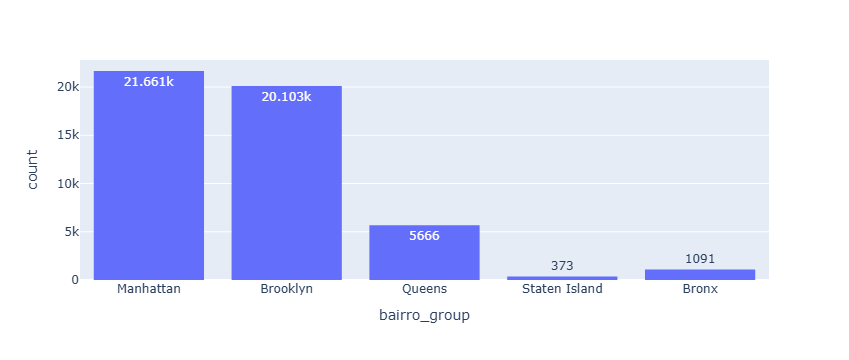

In [256]:
px.histogram(df,x='bairro_group', text_auto=True)

#### Vendo como esses valores ausentes estão relacionados e se posso excluir eles da minha base de dados

In [258]:
df[df["nome"].isna()]

,id,nome,host_id,host_name,bairro_group,bairro,latitude,longitude,room_type,price,minimo_noites,numero_de_reviews,ultima_review,reviews_por_mes,calculado_host_listings_count,disponibilidade_365
2853,1615764,NaN,6676776,Peter,Manhattan,Battery Park City,40.71239,-74.01620,Entire home/apt,400,1000,0,NaN,NaN,1,362
3702,2232600,NaN,11395220,Anna,Manhattan,East Village,40.73215,-73.98821,Entire home/apt,200,1,28,2015-06-08,0.45,1,341
5774,4209595,NaN,20700823,Jesse,Manhattan,Greenwich Village,40.73473,-73.99244,Entire home/apt,225,1,1,2015-01-01,0.02,1,0
5974,4370230,NaN,22686810,Michaël,Manhattan,Nolita,40.72046,-73.99550,Entire home/apt,215,7,5,2016-01-02,0.09,1,0
6268,4581788,NaN,21600904,Lucie,Brooklyn,Williamsburg,40.71370,-73.94378,Private room,150,1,0,NaN,NaN,1,0
6566,4756856,NaN,1832442,Carolina,Brooklyn,Bushwick,40.70046,-73.92825,Private room,70,1,0,NaN,NaN,1,0
6604,4774658,NaN,24625694,Josh,Manhattan,Washington Heights,40.85198,-73.93108,Private room,40,1,0,NaN,NaN,1,0
8840,6782407,NaN,31147528,Huei-Yin,Brooklyn,Williamsburg,40.71354,-73.93882,Private room,45,1,0,NaN,NaN,1,0
11962,9325951,NaN,33377685,Jonathan,Manhattan,Hell's Kitchen,40.76436,-73.98573,Entire home/apt,190,4,1,2016-01-05,0.02,1,0
12823,9787590,NaN,50448556,Miguel,Manhattan,Harlem,40.80316,-73.95189,Entire home/apt,300,5,0,NaN,NaN,5,0


In [259]:
df[df["host_name"].isna()]

,id,nome,host_id,host_name,bairro_group,bairro,latitude,longitude,room_type,price,minimo_noites,numero_de_reviews,ultima_review,reviews_por_mes,calculado_host_listings_count,disponibilidade_365
359,100184,Bienvenue,526653,NaN,Queens,Queens Village,40.72413,-73.76133,Private room,50,1,43,2019-07-08,0.45,1,88
2699,1449546,Cozy Studio in Flatbush,7779204,NaN,Brooklyn,Flatbush,40.64965,-73.96154,Entire home/apt,100,30,49,2017-01-02,0.69,1,342
5744,4183989,SPRING in the City!! Zen-Style Tranquil Bedroom,919218,NaN,Manhattan,Harlem,40.80606,-73.95061,Private room,86,3,34,2019-05-23,1.00,1,359
6074,4446862,Charming Room in Prospect Heights!,23077718,NaN,Brooklyn,Crown Heights,40.67512,-73.96146,Private room,50,1,0,NaN,NaN,1,0
6581,4763327,"Luxurious, best location, spa inc'l",24576978,NaN,Brooklyn,Greenpoint,40.72035,-73.95355,Entire home/apt,195,1,1,2015-10-20,0.02,1,0
8162,6292866,Modern Quiet Gem Near All,32722063,NaN,Brooklyn,East Flatbush,40.65263,-73.93215,Entire home/apt,85,2,182,2019-06-19,3.59,2,318
8256,6360224,"Sunny, Private room in Bushwick",33134899,NaN,Brooklyn,Bushwick,40.70146,-73.92792,Private room,37,1,1,2015-07-01,0.02,1,0
8851,6786181,R&S Modern Spacious Hideaway,32722063,NaN,Brooklyn,East Flatbush,40.64345,-73.93643,Entire home/apt,100,2,157,2019-06-19,3.18,2,342
9137,6992973,1 Bedroom in Prime Williamsburg,5162530,NaN,Brooklyn,Williamsburg,40.71838,-73.95630,Entire home/apt,145,1,0,NaN,NaN,1,0
9816,7556587,Sunny Room in Harlem,39608626,NaN,Manhattan,Harlem,40.82929,-73.94182,Private room,28,1,1,2015-08-01,0.02,1,0


In [260]:
df[df["ultima_review"].isna()]

,id,nome,host_id,host_name,bairro_group,bairro,latitude,longitude,room_type,price,minimo_noites,numero_de_reviews,ultima_review,reviews_por_mes,calculado_host_listings_count,disponibilidade_365
1,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,NaN,NaN,1,365
18,7750,Huge 2 BR Upper East Cental Park,17985,Sing,Manhattan,East Harlem,40.79685,-73.94872,Entire home/apt,190,7,0,NaN,NaN,2,249
25,8700,Magnifique Suite au N de Manhattan - vue Cloitres,26394,Claude & Sophie,Manhattan,Inwood,40.86754,-73.92639,Private room,80,4,0,NaN,NaN,1,0
35,11452,Clean and Quiet in Brooklyn,7355,Vt,Brooklyn,Bedford-Stuyvesant,40.68876,-73.94312,Private room,35,60,0,NaN,NaN,1,365
37,11943,Country space in the city,45445,Harriet,Brooklyn,Flatbush,40.63702,-73.96327,Private room,150,1,0,NaN,NaN,1,365
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48889,36484665,Charming one bedroom - newly renovated rowhouse,8232441,Sabrina,Brooklyn,Bedford-Stuyvesant,40.67853,-73.94995,Private room,70,2,0,NaN,NaN,2,9
48890,36485057,Affordable room in Bushwick/East Williamsburg,6570630,Marisol,Brooklyn,Bushwick,40.70184,-73.93317,Private room,40,4,0,NaN,NaN,2,36
48891,36485431,Sunny Studio at Historical Neighborhood,23492952,Ilgar & Aysel,Manhattan,Harlem,40.81475,-73.94867,Entire home/apt,115,10,0,NaN,NaN,1,27
48892,36485609,43rd St. Time Square-cozy single bed,30985759,Taz,Manhattan,Hell's Kitchen,40.75751,-73.99112,Shared room,55,1,0,NaN,NaN,6,2


<h4>Resultado da análise:</h4>
<h6>-Será necessário tratar dados ausentes das colunas:</h6>
<h6><li>nome e host_name: serão substituidos por 'Desconhecido' pois algumas linhas possuem dados relevantes</h6>
<h6><li>ultima_review cujo valores sao ausentes serao removidos</li></h6>

#### Preenchendo valores nulos das colunas: nome e host_name



In [264]:
df['nome'].fillna('Desconhecido', inplace=True)
df['host_name'].fillna('Desconhecido', inplace=True)
df.dropna(subset='ultima_review',inplace=True)

C:\Users\Joao\AppData\Local\Temp\ipykernel_2072\2805465812.py:1: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.



C:\Users\Joao\AppData\Local\Temp\ipykernel_2072\2805465812.py:2: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True

###### *esses avisos costumam aparecer pois eu estou alterando o df original, eu poderia usar uma abordagem mais especifica usando o comando .copy para remover esse erro*

In [266]:
# se nome = 'desconhecido' e host_name = 'desconhecido' 
dados_inconsistentes = df.query('(nome == "Desconhecido" & host_name == "Desconhecido")')
dados_inconsistentes.index

Index([], dtype='int64')

#### Ajustando o tipo dos dados de acordo com o que eles representam

In [269]:
df['ultima_review'] = pd.to_datetime(df['ultima_review'], format='%Y-%m-%d')
df['price'] = df['price'].astype(float)

#### Resetando o index

In [272]:
df.reset_index(drop=True, inplace=True)
df.dtypes

id                                        int64
nome                                     object
host_id                                   int64
host_name                                object
bairro_group                             object
bairro                                   object
latitude                                float64
longitude                               float64
room_type                                object
price                                   float64
minimo_noites                             int64
numero_de_reviews                         int64
ultima_review                    datetime64[ns]
reviews_por_mes                         float64
calculado_host_listings_count             int64
disponibilidade_365                       int64
dtype: object

# Analisando variaveis numéricas

<h4>Agora vou em busca de ver se ha a presenca de outliers e caso tenha, como vou tratar eles: se vou remover, analisar separadamente ou manter na base de dados</h4>

In [276]:
df[['price','minimo_noites']].describe()

,price,minimo_noites
count,38842.000000,38842.000000
mean,142.317775,5.868184
std,196.948156,17.384990
min,0.000000,1.000000
25%,69.000000,1.000000
50%,101.000000,2.000000
75%,170.000000,4.000000
max,10000.000000,1250.000000


<h4>Por essa pré análise há valores muito fora do padrão então tenho que fazer a seguinte verificação:</h4>
<h6><ul>Do que se tratam esses valores e me perguntar 'se eu remover eles, eles vão alterar o resultado final?'</ul></h6>

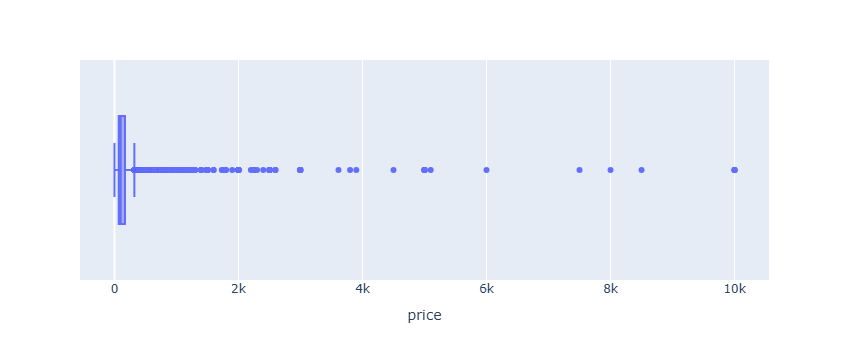

In [278]:
px.box(df, x='price')

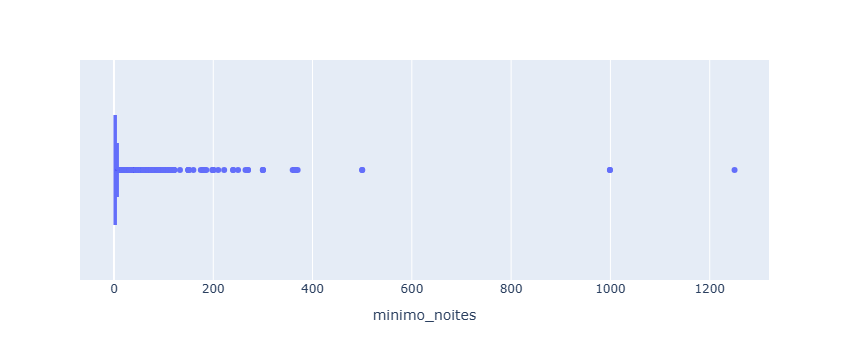

In [279]:
px.box(df, x='minimo_noites')

#### Limitando os dias em 30

In [281]:
df_limpo = df.query('minimo_noites <= 30')
df_limpo[['minimo_noites','price']].describe()

,minimo_noites,price
count,38403.000000,38403.000000
mean,4.867484,141.659688
std,7.293276,183.730298
min,1.000000,0.000000
25%,1.000000,69.000000
50%,2.000000,100.000000
75%,4.000000,170.000000
max,30.000000,10000.000000


<div>
    <h4><i>O que esses resultados mostram pra mim?</i></h4>
    <h6>1. a maior parte dos imoveis sao de curta duracao <i>(airbnbs)</i> sendo 75% dos meus dados representando no maximo 5 noites, ou seja sinal positivo para a remocao de outliers da coluna minimo de noites</h6>
    <h6>2. valores discrepantes da coluna de precos indica que existem imoveis de curta duracao de <i>luxo</i>, sendo cabivel eu separa-los por faixa de preco</h6>
    <h4>Sempre é uma decisão dificil saber se vamos remover dados outliers ou não ainda mais quando não se tem contato com outras pessoas que estão na equipe, pois eles podem impactar significativamente no enviesamento do modelo final. Mas após pesquisar, refletir bastante e olhar a estrutura dos dados, não faz sentido ter um unico comodo avaliado em 10.000$ e minimo de noites de 3 anos, até porque a Lei Local 18 de NY que entrou em vigor em 5 de Setembro de 2024:</h4>
    <h6>
        <content>
            <i>"[...]A Lei Local 18 da cidade de Nova York, também conhecida como Lei de Registro de Aluguel de Curta Duração, entrou em vigor em 5 de setembro, alterando a forma como os aluguéis de apartamentos de curto prazo operam na cidade. A nova legislação local determinou que, a partir de agora, os proprietários deverão se registrar no Office of Special Enforcement (OSE) para obter uma licença, e os aluguéis só serão permitidos se o anfitrião morar no local e estiver presente durante a estadia do hóspede. O número de hóspedes também é limitado a apenas dois, e a duração é limitada a 30 dias. A legislação não é uma proibição explícita de plataformas como o Airbnb, mas as regulamentações rigorosas tornam quase impossível que o serviço continue sua atividade."</i>
        </content>
    </h6>
    <h6>
        fonte: <a href='https://www.archdaily.com.br/br/1006685/nova-york-aprova-lei-restritiva-a-airbnbs-e-alugueis-de-curta-duracao#:~:text=O%20n%C3%BAmero%20de%20h%C3%B3spedes%20tamb%C3%A9m,o%20servi%C3%A7o%20continue%20sua%20atividade.'>clique aqui</a>
    </h6>
</div>

###### Função para detectar outliers

<img src='./Cheat+Sheet+-+Pandas_Limpeza+e+tratamento+de+dados 1_pages-to-jpg-0001 (1).jpg.png'>

In [286]:
def detectar_outliers(df, column):
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    limite_inferior = Q1 - 1.5 * IQR
    limite_superior = Q3 + 1.5 * IQR
    return df[(df[column] < limite_inferior) | (df[column] > limite_superior)]

In [287]:
imoveis_acima_de_334 = detectar_outliers(df_limpo, 'price')
imoveis_abaixo_de_334 = df_limpo.drop(imoveis_acima_de_334.index)

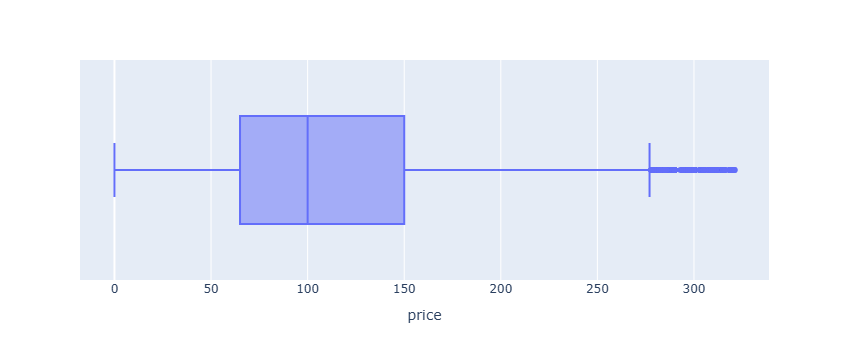

In [288]:
px.box(imoveis_abaixo_de_334, x='price')

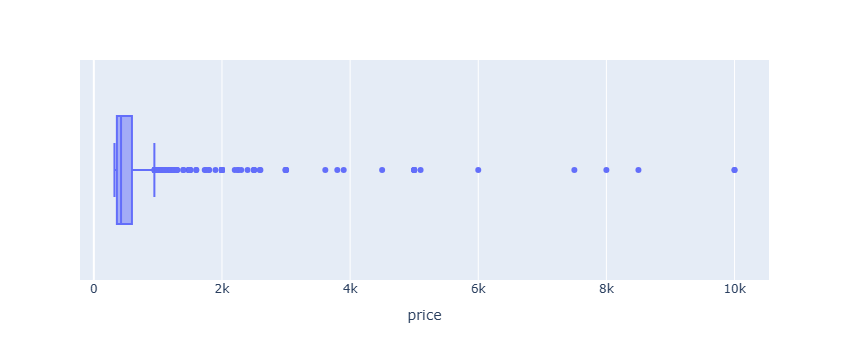

In [289]:
px.box(imoveis_acima_de_334, x='price')

# Supondo que uma pessoa esteja pensando em investir em um apartamento para alugar na plataforma, onde seria mais indicada a compra?

## Rentabilidade media

In [293]:
df_rentabilidade = df_limpo[['price','disponibilidade_365','bairro','bairro_group']].copy(deep=True)

##### Adicionando nova coluna para dizer qual a rentabilidade dos imoveis

In [295]:
df_rentabilidade['rentabilidade'] = df_rentabilidade['price'] * df['disponibilidade_365']
df_rentabilidade.groupby('bairro')[['rentabilidade']].mean().sort_values(by='rentabilidade', ascending=False).head(10)

,rentabilidade
bairro,
Sea Gate,102150.000000
Willowbrook,87399.000000
Tribeca,74620.880734
Neponsit,70670.000000
Mill Basin,57636.500000
Castleton Corners,53625.000000
Flatiron District,53313.810345
Riverdale,51651.142857
Belle Harbor,50778.800000


##### Distribuição de preços pela região de NY

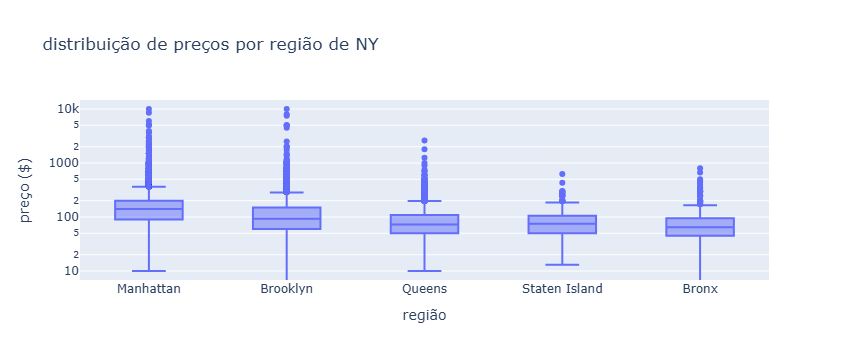

In [297]:
fig = px.box(df_rentabilidade, x='bairro_group', y='price', title='distribuição de preços por região de NY')
fig.update_layout(xaxis_title = 'região',yaxis_title='preço ($)',yaxis_type='log')

#### Média de precos por bairro

In [299]:
preco_por_bairro = df_limpo.groupby('bairro')['price'].mean().reset_index().sort_values(by='price', ascending=False)

#### Média de precos comparando a qtd de reviews por mes e preco por bairro

In [301]:
comparacao_preco_review= df_limpo.groupby('bairro').agg({'price':'mean', 'reviews_por_mes':'mean'}).sort_values('reviews_por_mes', ascending=False).head(10)

In [302]:
dez_bairros_mais_caros = preco_por_bairro.head(10)
dez_bairros_mais_caros

,bairro,price
172,Sea Gate,482.500000
195,Tribeca,461.779817
142,NoHo,298.451613
75,Flatiron District,291.482759
176,SoHo,282.436170
138,Neponsit,274.666667
126,Midtown,268.296221
207,West Village,251.993300
213,Willowbrook,249.000000
91,Greenwich Village,239.277397


In [303]:
dez_bairros_mais_baratos = preco_por_bairro.tail(10)
dez_bairros_mais_baratos

,bairro,price
201,Van Nest,58.555556
50,Corona,56.932203
147,Olinville,53.000000
177,Soundview,52.846154
24,Bronxdale,51.875000
101,Hunts Point,51.812500
194,Tremont,49.900000
27,Bull's Head,48.000000
115,Little Neck,42.333333
140,New Dorp Beach,38.000000


In [304]:
comparacao_preco_review

,price,reviews_por_mes
bairro,,
New Dorp Beach,38.000000,5.500000
East Elmhurst,81.222222,4.822982
Springfield Gardens,93.350000,4.455250
Silver Lake,70.000000,4.340000
Rosebank,111.857143,3.812857
Huguenot,118.333333,3.760000
Whitestone,127.875000,3.320000
Jamaica Hills,136.714286,3.315714
Queens Village,77.840000,3.220800


<h4>Criando gráficos para mostrar algumas comparações de lugares com valores mais acessíveis como: os 10 bairros mais baratos e os mais caros, além de mostrar os bairros mais rentáveis de acordo com a média de preços e média de reviews por bairro, para dar um maior panorama para o cliente na hora de tomar sua decisão</h4>

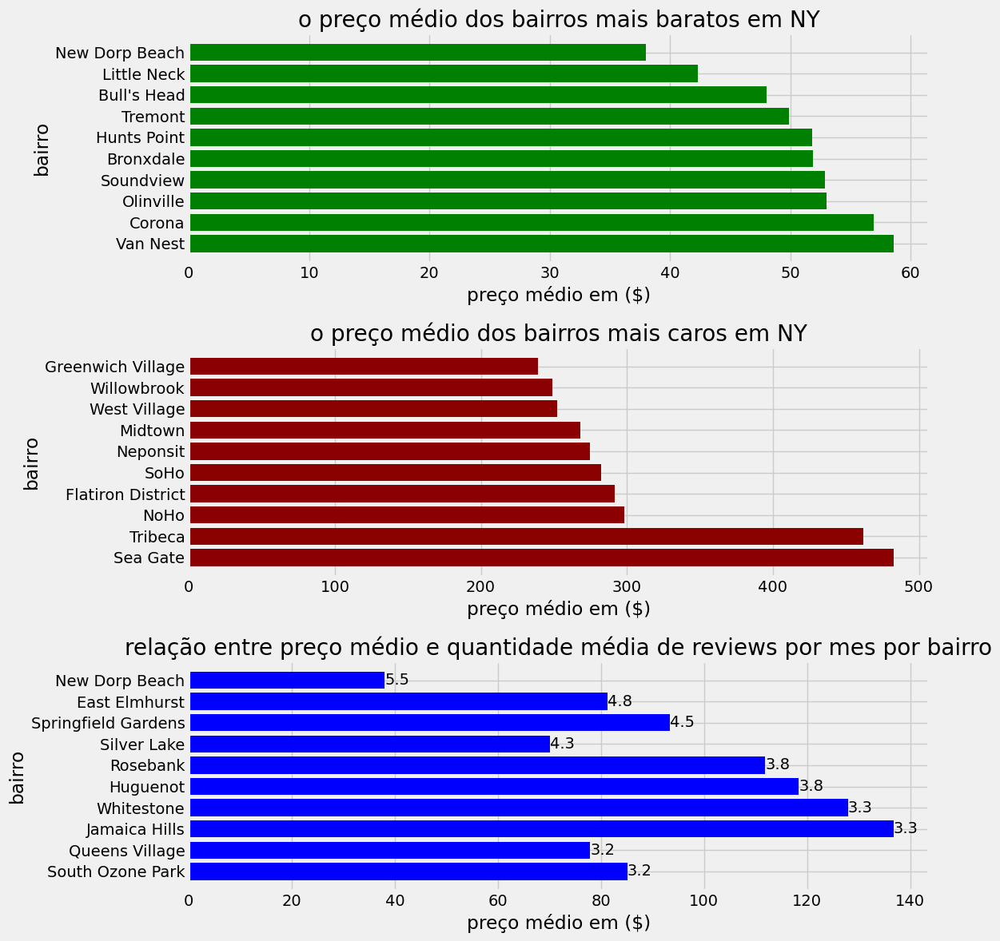

In [306]:
'''
Aqui diferentemente dos outros graficos optei por usar o matplotlib por conta da facilidade para criar conjunto de graficos,
além de ser bem intuitivo. Para criar o 3 grafico tive que reordenar os valores para que correspondessem com a qtd de reviews
e no final criei um laço de repeticao para eu mostrar a qtd de reviews correspondente ao bairro, permitindo melhor visualização 
'''

fig, axs = plt.subplots(3,1, figsize=(12,12))
plt.style.use('fivethirtyeight')
axs[0].barh(dez_bairros_mais_baratos['bairro'],dez_bairros_mais_baratos['price'], color='green')
axs[0].set_title('o preço médio dos bairros mais baratos em NY')
axs[0].set_xlabel('preço médio em ($)')
axs[0].set_ylabel('bairro')

axs[1].barh(dez_bairros_mais_caros['bairro'],dez_bairros_mais_caros['price'], color='darkred')
axs[1].set_title('o preço médio dos bairros mais caros em NY')
axs[1].set_xlabel('preço médio em ($)')
axs[1].set_ylabel('bairro') 
fig.tight_layout()

comparacao_preco_review_sorted = comparacao_preco_review.sort_values(by='reviews_por_mes')

axs[2].barh(comparacao_preco_review_sorted.index,comparacao_preco_review_sorted['price'],color='blue')
axs[2].set_title('relação entre preço médio e quantidade média de reviews por mes por bairro')
axs[2].set_xlabel('preço médio em ($)')
axs[2].set_ylabel('bairro') 

fig.tight_layout()

for i, (price, reviews) in enumerate(zip(comparacao_preco_review_sorted['price'], comparacao_preco_review_sorted['reviews_por_mes'])):
    axs[2].text(price, i, f'{reviews:.1f}', va='center')


<h4>R: regiões como Manhattan, Brooklyn e Queens tem preços mais elevados, então podem ser mais lucrativos, porem maiores riscos, em contra partida bairros mais baratos e mais rentéveis como East Elmhurst</h4>

In [308]:
df_limpo.query('bairro == "East Elmhurst" & room_type== "Entire home/apt"')

,id,nome,host_id,host_name,bairro_group,bairro,latitude,longitude,room_type,price,minimo_noites,numero_de_reviews,ultima_review,reviews_por_mes,calculado_host_listings_count,disponibilidade_365
2026,973535,"Garden Apt, 5 mins from LaGuardia",3179866,Gonzalo And Nora,Queens,East Elmhurst,40.76356,-73.88850,Entire home/apt,99.0,3,158,2019-07-02,2.08,2,322
4840,3836199,"2 bedroom with yard, 4 mins to LGA",19758179,Telmo,Queens,East Elmhurst,40.76287,-73.88367,Entire home/apt,120.0,3,102,2019-06-04,1.73,1,300
6765,5738785,Compact cosy studio with separate kitchen,22557949,Ray,Queens,East Elmhurst,40.75830,-73.87679,Entire home/apt,112.0,2,3,2019-05-19,0.35,1,338
7072,6152725,A Cozy 4 bedrm Apt Queen(5minsLGA),31916657,Rosario,Queens,East Elmhurst,40.76509,-73.87700,Entire home/apt,275.0,3,96,2019-07-01,1.90,1,333
9471,8459744,Studio style Room with private bath,30791331,Tsepak,Queens,East Elmhurst,40.75680,-73.88894,Entire home/apt,89.0,2,9,2019-05-27,0.20,2,331
11852,10859700,Beautiful Large 2 Bedroom Apartment,53199312,Zamena,Queens,East Elmhurst,40.76327,-73.88655,Entire home/apt,145.0,2,61,2019-06-10,1.52,1,302
12435,11826442,Comfy Sanctuary walk to Laguardia!!,4348515,Olga,Queens,East Elmhurst,40.76969,-73.87912,Entire home/apt,80.0,3,68,2019-06-20,1.79,1,334
13026,12645495,Newly Renovated Private 3 bedroom Apt.Near,60077920,Nicole,Queens,East Elmhurst,40.76107,-73.86664,Entire home/apt,175.0,2,74,2019-06-24,2.42,1,141
15060,14274403,New York City Getaway; very close to LGA,87041889,Laverne & David,Queens,East Elmhurst,40.76777,-73.87733,Entire home/apt,76.0,2,75,2019-06-24,4.39,1,35
15254,14483613,Modern Apt - 10 min from Manhattan,89211125,Caroline,Queens,East Elmhurst,40.75720,-73.89569,Entire home/apt,100.0,3,87,2019-06-13,2.52,1,322


# O número mínimo de noites e a disponibilidade ao longo do ano interferem no preço?

#### verificando a relacao entre a disponibilidade do imovel e o preço

In [313]:
df_distribuicao = df_limpo[['nome','price','minimo_noites','disponibilidade_365']].copy()
df_distribuicao

,nome,price,minimo_noites,disponibilidade_365
0,Skylit Midtown Castle,225.0,1,355
1,Cozy Entire Floor of Brownstone,89.0,1,194
2,Entire Apt: Spacious Studio/Loft by central park,80.0,10,0
3,Large Cozy 1 BR Apartment In Midtown East,200.0,3,129
5,Large Furnished Room Near B'way,79.0,2,220
...,...,...,...,...
38837,Lovely Privet Bedroom with Privet Restroom,129.0,1,147
38838,No.2 with queen size bed,45.0,1,339
38839,Seas The Moment,235.0,1,87
38840,1B-1B apartment near by Metro,100.0,1,40


In [314]:
df_distribuicao[['price', 'disponibilidade_365']].corr()

,price,disponibilidade_365
price,1.000000,0.086051
disponibilidade_365,0.086051,1.000000


##### Adicionando uma nova coluna para dizer em qual nivel de precificacao os imoveis se encontram

In [316]:
df_distribuicao['faixa_preco'] = pd.qcut(df['price'], q=4, labels=['baixo', 'medio', 'alto', 'muito alto'])

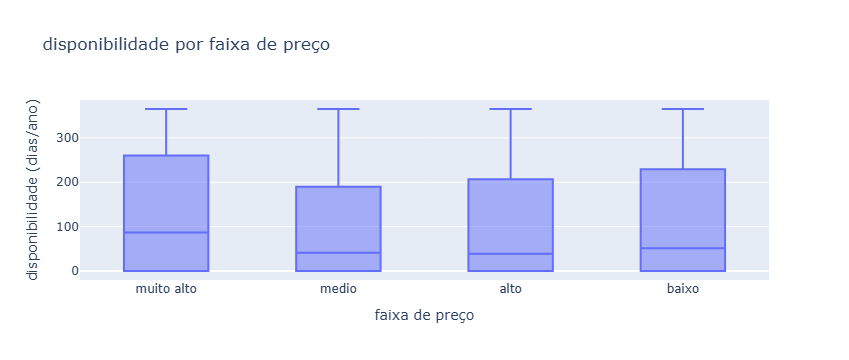

In [318]:
fig = px.box(df_distribuicao, x='faixa_preco', y='disponibilidade_365', title='disponibilidade por faixa de preço')
fig.update_layout(xaxis_title='faixa de preço', yaxis_title='disponibilidade (dias/ano)')

##### com isso podemos ver se imoveis mais caros tem mais ou menos disponibilidade ao longo do tempo: quanto mais alto o valor do imovel, mais diponivel ao longo do tempo ele se encontra. ainda mais para valores muito altos

<h4>Vendo relação entre o mínimo de noites e o preço</h4>
<h6><li>curta: <= 3 dias</li></h6>
<h6><li>media: 4-7 dias</li></h6>
<h6><li>longa: 8-15 dias</li></h6>
<h6><li>muito longa: 16-30 dias</li></h6>

In [322]:
df_distribuicao['faixa_minimo_noites'] = pd.cut(df_distribuicao['minimo_noites'], bins=[0,3, 7, 15, 30], labels=['curta', 'media', 'longa', 'muito longa'])
df_distribuicao

,nome,price,minimo_noites,disponibilidade_365,faixa_preco,faixa_minimo_noites
0,Skylit Midtown Castle,225.0,1,355,muito alto,curta
1,Cozy Entire Floor of Brownstone,89.0,1,194,medio,curta
2,Entire Apt: Spacious Studio/Loft by central park,80.0,10,0,medio,longa
3,Large Cozy 1 BR Apartment In Midtown East,200.0,3,129,muito alto,curta
5,Large Furnished Room Near B'way,79.0,2,220,medio,curta
...,...,...,...,...,...,...
38837,Lovely Privet Bedroom with Privet Restroom,129.0,1,147,alto,curta
38838,No.2 with queen size bed,45.0,1,339,baixo,curta
38839,Seas The Moment,235.0,1,87,muito alto,curta
38840,1B-1B apartment near by Metro,100.0,1,40,medio,curta


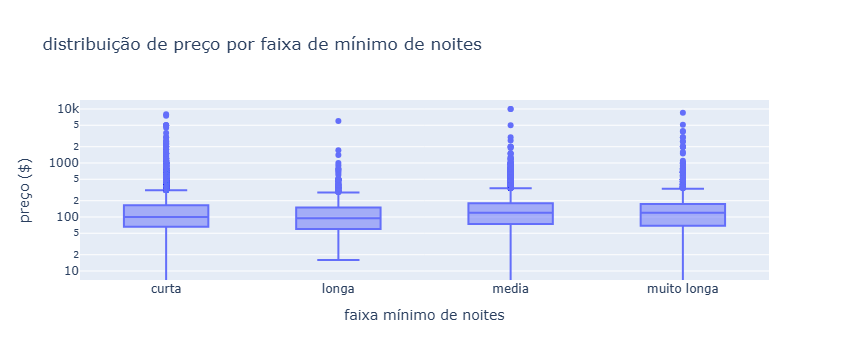

In [323]:
fig = px.box(df_distribuicao, x='faixa_minimo_noites', y='price', title='distribuição de preço por faixa de mínimo de noites')
fig.update_layout(xaxis_title='faixa mínimo de noites', yaxis_title='preço ($)', yaxis_type='log')

In [324]:
df_distribuicao[['minimo_noites','price']].corr()

,minimo_noites,price
minimo_noites,1.000000,0.024087
price,0.024087,1.000000


### Autenticando a relação das variáveis atravás da tácnica Pearson e uma regressão linear (OLS)

In [326]:
df_distribuicao[['price','minimo_noites','disponibilidade_365']].corr(method='pearson')

,price,minimo_noites,disponibilidade_365
price,1.000000,0.024087,0.086051
minimo_noites,0.024087,1.000000,0.177239
disponibilidade_365,0.086051,0.177239,1.000000


###### Ajusta um modelo básico de regressão linear para prever o preço do imóvel com base em minimo de noites e disponiblidade ao longo do ano e exibe um resumo estatistico

In [329]:
X = df_distribuicao[['minimo_noites', 'disponibilidade_365']]
X = sm.add_constant(X)
y = df_distribuicao['price']

modelo = sm.OLS(y, X).fit()
print(modelo.summary())


                            OLS Regression Results                            
Dep. Variable:                  price   R-squared:                       0.007
Model:                            OLS   Adj. R-squared:                  0.007
Method:                 Least Squares   F-statistic:                     144.8
Date:                Fri, 07 Feb 2025   Prob (F-statistic):           2.23e-63
Time:                        18:27:13   Log-Likelihood:            -2.5456e+05
No. Observations:               38403   AIC:                         5.091e+05
Df Residuals:                   38400   BIC:                         5.092e+05
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                          coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------
const                 126.8363    

<h5>Apenas com a verificação das correlacões entre as variáveis ja era possível notar que havia pouca interferencia do minimo de noites e a disponilidade ao longo dos na faixa de preços, decidi aplicar o Pearson e um modelo básico de regresão linear OLS(Ordinary Least Squares) para confirmar isso olhando o coef, R-squared e P>|t|. Mostrando que existem outras variáveis que podem explicar melhor a relação com o preço</h5>
<h6><li>Pearson: um método estatístico que mede a relação entre duas variáveis contínuas</li></h6>
<h6><li>coef: o impacto que cada variável independente tem sobre a variável dependente</li></h6>
<h6><li>R-squared: quanto da variação do preço é explicada pelas variáveis do modelo</li></h6>
<h6><li>P>|t|: se P>|t| < 0.05, significa que a variável tem um impacto significativo no preço, caso contrario ela nao tem</li></h6>

<h4>R: sob essa nova perspectiva do modelo é possível notar que o minimo de noites e disponibilidade ao longo do ano nao afetam gravemente o preço</h4>

# Existe algum padrão no texto do nome do local para lugares de mais alto valor?


###### Funcao para tratar texto

In [336]:
def processar_texto(texto):
    '''
    essa func verifica se o texto é ausente e caso ela seja retorna uma lista vazia,
    se nao ele vai converter o texto para minusculas e extrai palavras do testo,
    usando expressoes regulares
    \b indica um limite de palavra(evita pegar caracter extra)
    \w+ seleciona qualquer sequencia de caracteres alfanumericos
    '''
    if pd.isna(texto):
        return []
    return re.findall(r'\b\w+\b', texto.lower())

<>:2: SyntaxWarning:

invalid escape sequence '\w'

<>:2: SyntaxWarning:

invalid escape sequence '\w'

C:\Users\Joao\AppData\Local\Temp\ipykernel_2072\1844506836.py:2: SyntaxWarning:

invalid escape sequence '\w'



In [337]:
palavras = Counter()
for nome in df_distribuicao.query('faixa_preco == "muito alto"')['nome']:
    palavras.update(processar_texto(nome))

print(palavras.most_common(20))

[('in', 2637), ('bedroom', 1525), ('apartment', 1435), ('2', 1351), ('apt', 1172), ('1', 931), ('village', 880), ('the', 852), ('spacious', 771), ('studio', 767), ('loft', 745), ('of', 731), ('east', 728), ('park', 717), ('luxury', 687), ('manhattan', 653), ('with', 639), ('williamsburg', 586), ('private', 583), ('brooklyn', 569)]


#### R: sim palavras como: luxury, park, apartment, village, spacious, studio, loft

In [339]:
df_limpo.columns

Index(['id', 'nome', 'host_id', 'host_name', 'bairro_group', 'bairro',
       'latitude', 'longitude', 'room_type', 'price', 'minimo_noites',
       'numero_de_reviews', 'ultima_review', 'reviews_por_mes',
       'calculado_host_listings_count', 'disponibilidade_365'],
      dtype='object')

#  Como você faria a previsão do preço a partir dos dados?

<h4>1. Escolhendo as melhores features que descrevem meu label</h4> 
<li><u>bairro_group</u></li>
<li><u>room_type</u></li>
<li><u>diponibilidade_365</u></li>
<li><u>minimo_noites</u></li>
<li><u>numero_de_reviews</u></li>
<li><u>latitude</u></li>
<li><u>longitude</u></li>
<li><u>numero_de_reviews</u></li>



#### 2. Removendo colunas irrelevantes

In [343]:
features = df_limpo.drop(['price','id','host_id','nome','bairro','host_name','ultima_review'], axis= 1)
y = np.log1p(df_limpo['price'])
features.columns

Index(['bairro_group', 'latitude', 'longitude', 'room_type', 'minimo_noites',
       'numero_de_reviews', 'reviews_por_mes', 'calculado_host_listings_count',
       'disponibilidade_365'],
      dtype='object')

#### 3. Definindo colunas categóricas e numéricas

In [346]:
features_categoricas = ['bairro_group', 'room_type']
features_numericas = ['latitude', 'longitude', 'minimo_noites', 'numero_de_reviews', 'reviews_por_mes', 'calculado_host_listings_count', 'disponibilidade_365']

#### 4. Transformação one hot encoding + normalização

##### Usando função capaz de transformar o valor das colunas

In [352]:
one_hot = make_column_transformer((
    #se a variavel(coluna) tiver apenas duas categorias (sim/nao) ele vai remover
    OneHotEncoder(drop ='if_binary'), 
    #vai transformar as variaveis categoricas
    features_categoricas),
    #normaliza as variaveis numericas                              
    (StandardScaler(), features_numericas),                            
    #vai ignorar as demais colunas que nao estao na lista
    remainder= 'passthrough',
    #nesse processo, ela nao vai perder os valores originais
    sparse_threshold=0)

#### Aplicando transformações

In [354]:
x = one_hot.fit_transform(features)

#### 5. Criando dataframe

In [358]:
colunas = one_hot.get_feature_names_out(features.columns)
x = pd.DataFrame(x,columns=colunas)
x

,onehotencoder__bairro_group_Bronx,onehotencoder__bairro_group_Brooklyn,onehotencoder__bairro_group_Manhattan,onehotencoder__bairro_group_Queens,onehotencoder__bairro_group_Staten Island,onehotencoder__room_type_Entire home/apt,onehotencoder__room_type_Private room,onehotencoder__room_type_Shared room,standardscaler__latitude,standardscaler__longitude,standardscaler__minimo_noites,standardscaler__numero_de_reviews,standardscaler__reviews_por_mes,standardscaler__calculado_host_listings_count,standardscaler__disponibilidade_365
0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.464971,-0.699760,-0.530288,0.322551,-0.594951,-0.119803,1.860829
1,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,-0.779449,-0.186863,-0.530288,4.981817,1.932328,-0.157641,0.616239
2,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.280714,0.150012,0.703742,-0.422931,-0.761064,-0.157641,-0.883454
3,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.356848,-0.512417,-0.256059,0.923079,-0.470367,-0.157641,0.113764
4,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.669770,-0.724539,-0.393173,8.295073,1.238216,-0.157641,0.817228
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38398,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.962340,-0.056556,-0.530288,-0.588594,-0.227131,-0.157641,0.252911
38399,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.418088,2.914227,-0.530288,-0.588594,-0.227131,0.031548,1.737143
38400,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,-3.384408,-4.095857,-0.530288,-0.588594,-0.227131,-0.157641,-0.210911
38401,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.450804,0.577034,-0.530288,-0.567886,0.366127,-0.157641,-0.574239


#### 6. Separando dados de treino e teste

In [360]:
x_treino, x_teste, y_treino, y_teste = train_test_split(x, y, random_state=5)

#### 7.Criando e treinando o modelo

In [363]:
lr = linear_model.LinearRegression()
lr.fit(x_treino,y_treino)

LinearRegression()

#### 8. Fazendo a previsão

In [366]:
pred= lr.predict(x_teste)

#### 9. Avaliando o modelo

In [368]:
mae = mean_absolute_error(y_teste, pred)
rmse = np.sqrt(mean_squared_error(y_teste, pred))
r2 = r2_score(y_teste, pred)

#### 10. Exibindo métricas

In [370]:
print(f'R²: {r2 * 100:.2f}')
print(f'MAE: {mae:.2f}')
print(f'RMSE: {rmse:.2f}')

R²: 52.69
MAE: 0.33
RMSE: 0.46


#### 11. Testando outro modelo

In [372]:
rf = RandomForestRegressor(n_estimators=50, random_state=5)
rf.fit(x_treino, y_treino)

RandomForestRegressor(n_estimators=50, random_state=5)

#### 12. Avaliando o modelo

In [374]:
y_pred = rf.predict(x_teste)
mae = mean_absolute_error(y_teste, y_pred)
mse = mean_squared_error(y_teste, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_teste, y_pred)

#### 13. Exibindo métricas

In [376]:
print(f"MAE: {mae}")
print(f"RMSE: {rmse}")
print(f"R²: {r2}")

MAE: 0.297295881418302
RMSE: 0.4137513318317217
R²: 0.6127530638182817


# Quais variáveis e/ou suas transformações você utilizou e por quê? 

<h4>R:</h4>
<li><u>bairro_group: localizacao tem impacto significativo no preco</u></li>
<li><u>room_type: casas/ap geralmente sao mais caros que quartos individuais</u></li>
<li><u>diponibilidade_365: imoveis com mais disponilibidade tendem a ter precos mais altos</u></li>
<li><u>minimo_noites: influencia a atratividade do imovel</u></li>
<li><u>numero_de_reviews: influencia a popularidade, logo o preço</u></li>
<li><u>latitude: a localizacao influencia influencia no preço</u></li>
<li><u>longitude:  a localizacao influencia influencia no preço</u></li>
<li><u>reviews_por_mes: mede a popularidade ao longo do tempo</u></li>

#  Qual tipo de problema estamos resolvendo (regressão, classificação)?

<img src='./Captura de tela 2025-02-07 080859.png'>

#### R: regressao

# Qual medida de performance do modelo foi escolhida e por quê?


<h4>MAE(Mean Aboslute Error)</h4>
<h6><li>fácil de interpretar e esta na mesma unidade do preço, mede a diferença média entre valores reais e previstos</li></h6>
<h4>RMSE(Root Mean Squared Error)</h4>
<h6><li>indica o impactor dos erros maiores no modelo e reflete melhor a precisão do modelo, penaliza erros grandes mais do que o MAE</li></h6>
<h4>R^2</h4>
<h6><li>ele mede o quão bem os valores previstos explicam a variabilidade dos valores reais</li></h6>

# Qual modelo melhor se aproxima dos dados e quais seus prós e contras?

<h4>RandomForestRegressor</h4>
<li>ele foi o que apresentou melhor desempenho entre os dois modelo escolhidos</li>
<li>prós: bom contra overfitting, lida bem com outliers e funciona bem com dados nao lineares evitando transformacao de dados avancadas</li>
<li>contras: alto custo computacional, se precisar prever precos fora do intervalo observado nos dados ele pode nao generalizar muito bem</li>

<h1>Supondo um apartamento com as seguintes características:</h1>
<h6>{'id': 2595,
 'nome': 'Skylit Midtown Castle',
 'host_id': 2845,
 'host_name': 'Jennifer',
 'bairro_group': 'Manhattan',
 'bairro': 'Midtown',
 'latitude': 40.75362,
 'longitude': -73.98377,
 'room_type': 'Entire home/apt',
 'minimo_noites': 1,
 'numero_de_reviews': 45,
 'ultima_review': '2019-05-21',
 'reviews_por_mes': 0.38,
 'calculado_host_listings_count': 2,
 'disponibilidade_36': 355}
</h6>


In [400]:
novo_apartamento = pd.DataFrame([{
    'bairro_group': 'Manhattan',
    'bairro': 'Midtown',
    'latitude': 40.75362,
    'longitude': -73.98377,
    'room_type': 'Entire home/apt',
    'minimo_noites': 1,
    'numero_de_reviews': 45,
    'reviews_por_mes': 0.38,
    'calculado_host_listings_count': 2,
    'disponibilidade_365': 355
}])

#### Aplicando one hot encoding e padronizando os dados

In [409]:
novo_apartamento_encoded = one_hot.transform(novo_apartamento)

#### Fazendo previsão com o modelo treinado

###### reverter a transformação de log para obter o preço original

In [412]:
preco_log = rf.predict(novo_apartamento_encoded)  
preco_real = np.expm1(preco_log)

C:\Users\Joao\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning:

X does not have valid feature names, but RandomForestRegressor was fitted with feature names



<h1>Qual seria a sua sugestão de preço? </h1>

In [419]:
print(f'O preço estimado para o apartamento é: ${preco_real[0]:.2f}')

O preço estimado para o apartamento é: $250.79


# Salve o modelo desenvolvido no formato .pkl. 

#### salvando o modelo treinado

In [449]:
with open('modelo_precificacao.pkl','wb') as arquivo:
    pickle.dump(rf,arquivo)

#### salvando o one hot encoder 

In [452]:
with open('one_hot_endocer.pkl', 'wb') as arquivo:
    pickle.dump(one_hot, arquivo)